# Packages

In [1]:
# System
import warnings
warnings.filterwarnings("ignore")

# Data manipulation
import pandas as pd
pd.get_option("display.max_columns")
import numpy as np

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# Statistics
import statsmodels.api as sm
from statsmodels.stats.anova import AnovaRM
from pingouin import ttest
from scipy import stats
from scipy.stats import median_test
from sklearn.linear_model import LinearRegression

# Functions

In [2]:
# The following three functions make a correlation matrix with scatterplot in lower left, 
# pearson correlation coefficient bubble plot in upper right, and distribution
# plot down the diagonal
def corrdot(*args, **kwargs):
    corr_r = args[0].corr(args[1], 'pearson')
    corr_text = f"{corr_r:2.2f}".replace("0.", ".")
    ax = plt.gca()
    ax.set_axis_off()
    marker_size = 1
    ax.scatter([.5], [.5], marker_size, [corr_r], alpha=0.001, cmap="Greys", \
               vmin=-1, vmax=1, transform=ax.transAxes)
    font_size = 40
    ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction", ha='center', \
                va='center', fontsize=font_size)

def annotate_colname(x, **kws):
    ax = plt.gca()
    ax.annotate(x.name, xy=(0.05, 0.9), xycoords=ax.transAxes, fontweight='bold')
    
def corr_plot(df):
    sns.set(style='white', font_scale=1.6)
    g = sns.PairGrid(df, aspect=1.4, diag_sharey=False)
    g.map_lower(sns.regplot, scatter_kws={'s':10, 
                                          'color':'k'})
    g.map_diag(sns.distplot, kde_kws={'color': 'black'})
    g.map_diag(annotate_colname)
    g.map_upper(corrdot)
    plt.rcParams["figure.dpi"] = 300
    plt.show()

def theory_cat(df, col):
    cat = []
    for i in range(len(df)):
        if df[col][i]>2:
            categ = 'low'
        else:
            categ = 'high'
        cat.append(str(col+"_"+categ))
    return cat

# Read in the data

In [3]:
raw_data = pd.read_csv("../data/01_raw/raw_for_analysis.csv")
data = raw_data.copy()

In [4]:
data.sample(5)

,group,race,education,income,one_ten_prop_10,one_ten_q1,one_ten_q2,one_ten_q3,one_ten_q4,one_ten_q5,...,other_rank_1,other_rank_1_text,other_rank_2,other_rank_2_text,other_rank_3,other_rank_3_text,other_rank_4,other_rank_4_text,other_rank_5,other_rank_5_text
8,1,White or Caucasian,High school diploma or GED,"25,000-49,999",1.0,10,10,10,10,10,...,10.0,Not caring,6.0,Not nice,7.0,Being nasty,8.0,Being offensive,9.0,Being rude
28,1,White or Caucasian,Associates or technical degree,"Less than 25,000",1.0,10,10,10,10,10,...,7.0,NaN,1.0,How would I feel,8.0,NaN,10.0,NaN,9.0,NaN
6,1,White or Caucasian,High school diploma or GED,"50,000-74,999",0.0,100,100,100,100,100,...,6.0,NaN,7.0,NaN,8.0,NaN,9.0,NaN,10.0,NaN
7,1,White or Caucasian,High school diploma or GED,"25,000-49,999",0.3,10,10,10,100,100,...,6.0,NaN,7.0,NaN,8.0,NaN,9.0,NaN,10.0,NaN
13,1,White or Caucasian,"Some college, but no degree","25,000-49,999",1.0,10,10,10,10,10,...,6.0,NaN,7.0,NaN,8.0,NaN,9.0,NaN,10.0,NaN


# Demographics information

In [5]:
for col in ['race', 'education', 'income']:
    temp_df = data[col].value_counts().reset_index()
    temp_df['percentage'] = (temp_df[col]/temp_df[col].sum())*100
    print(col, temp_df, "\n\n")

race                                               index  race  percentage
0                                White or Caucasian    58   82.857143
1                         Black or African American     4    5.714286
2                                             Asian     4    5.714286
3                   Black or African American,Other     1    1.428571
4                          White or Caucasian,Other     1    1.428571
5         Native Hawaiian or Other Pacific Islander     1    1.428571
6  American Indian/Native American or Alaska Native     1    1.428571 


education                                                index  education  percentage
0                                  Bachelor's degree         29   42.028986
1                        Some college, but no degree         15   21.739130
2  Graduate or professional degree (MA, MS, MBA, ...         12   17.391304
3                         High school diploma or GED          9   13.043478
4                     Associates or techni

# Analytic Dataframe

In [6]:
# Subset the dataframe to only the cols with the primary DVs. 
df = data[[
    'group', 
    'race',
    'education',
    'income',
    'one_ten_prop_10',
    'five_one_prop_50',
    'one_five_prop_10',
    'ten_one_prop_100',
    'loss_money_h',
    'gain_money_h',
    'loss_ethics_h',
    'gain_ethics_h',
    'utilitarian_rank',
    'deontology_rank',
    'virtue_rank',
    'ethics_care_rank',
    'contract_theory_rank'
]]

# Check out a snippet of the resulting df
df[::7]

,group,race,education,income,one_ten_prop_10,five_one_prop_50,one_five_prop_10,ten_one_prop_100,loss_money_h,gain_money_h,loss_ethics_h,gain_ethics_h,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank
0,1,White or Caucasian,High school diploma or GED,"Less than 25,000",0.8,0.2,0.6,0.3,7.05,0.23,0.29,9.65,3.0,1.0,5.0,4.0,6.0
7,1,White or Caucasian,High school diploma or GED,"25,000-49,999",0.3,0.9,0.6,0.5,2.51,3.45,16.61,9.65,1.0,2.0,4.0,5.0,3.0
14,1,Black or African American,"Graduate or professional degree (MA, MS, MBA, ...","50,000-74,999",0.0,1.0,0.0,1.0,0.94,1.06,16.61,9.65,1.0,2.0,3.0,4.0,5.0
21,1,White or Caucasian,Bachelor's degree,"25,000-49,999",1.0,0.1,1.0,0.0,16.61,99.50,16.61,9.65,1.0,2.0,4.0,3.0,5.0
28,1,White or Caucasian,Associates or technical degree,"Less than 25,000",1.0,0.0,1.0,0.0,16.61,99.50,16.61,0.18,2.0,3.0,6.0,5.0,4.0
35,1,Asian,"Some college, but no degree",Prefer not to say,0.7,0.5,0.4,0.4,9.65,0.23,7.05,9.65,1.0,3.0,2.0,4.0,5.0
42,2,White or Caucasian,"Some college, but no degree","$50,000-$74,999",0.7,0.4,0.6,0.4,1.22,2.13,1.06,0.63,1.0,6.0,4.0,2.0,5.0
49,2,Asian,High school diploma or GED,Prefer not to say,1.0,0.5,0.3,0.0,4.29,0.82,3.45,9.65,2.0,1.0,3.0,5.0,4.0
56,2,White or Caucasian,Bachelor's degree,"$75,000-$99,999",1.0,0.5,0.5,0.0,2.13,1.82,0.01,0.82,5.0,4.0,1.0,3.0,2.0
63,2,Black or African American,"Some college, but no degree","Less than $25,000",0.9,0.2,0.8,0.1,3.45,3.45,9.65,0.82,5.0,2.0,1.0,3.0,4.0


# Visualizations

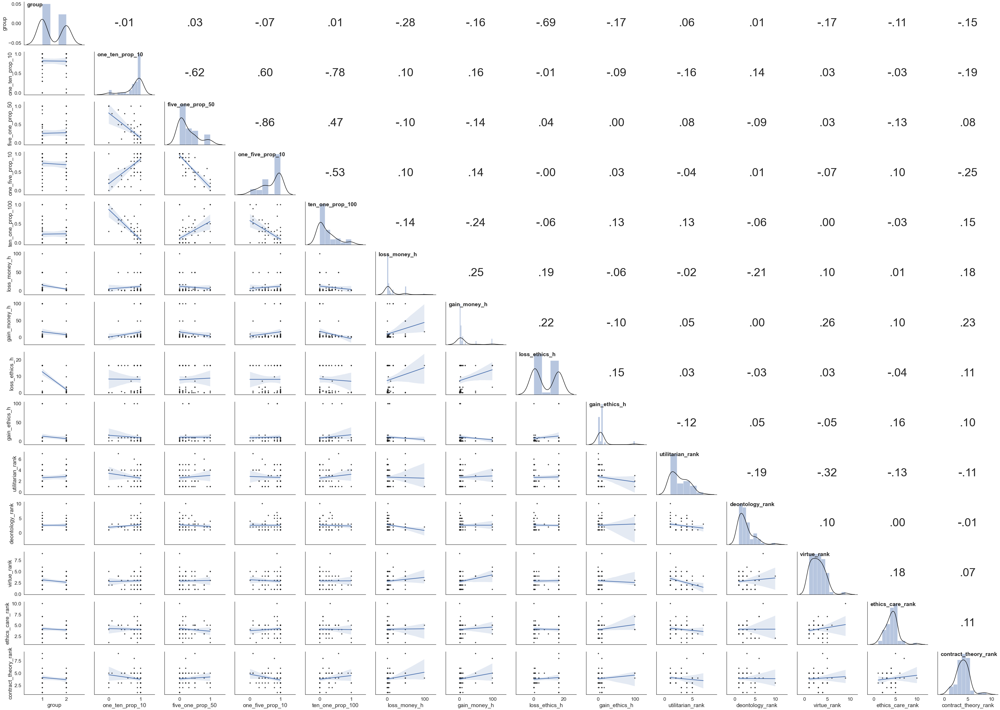

In [7]:
# Plot all of it
corr_plot(df)

### Probability Matching

In [8]:
prob_match_df = df[['one_ten_prop_10', 'one_five_prop_10', 'five_one_prop_50', 'ten_one_prop_100']]

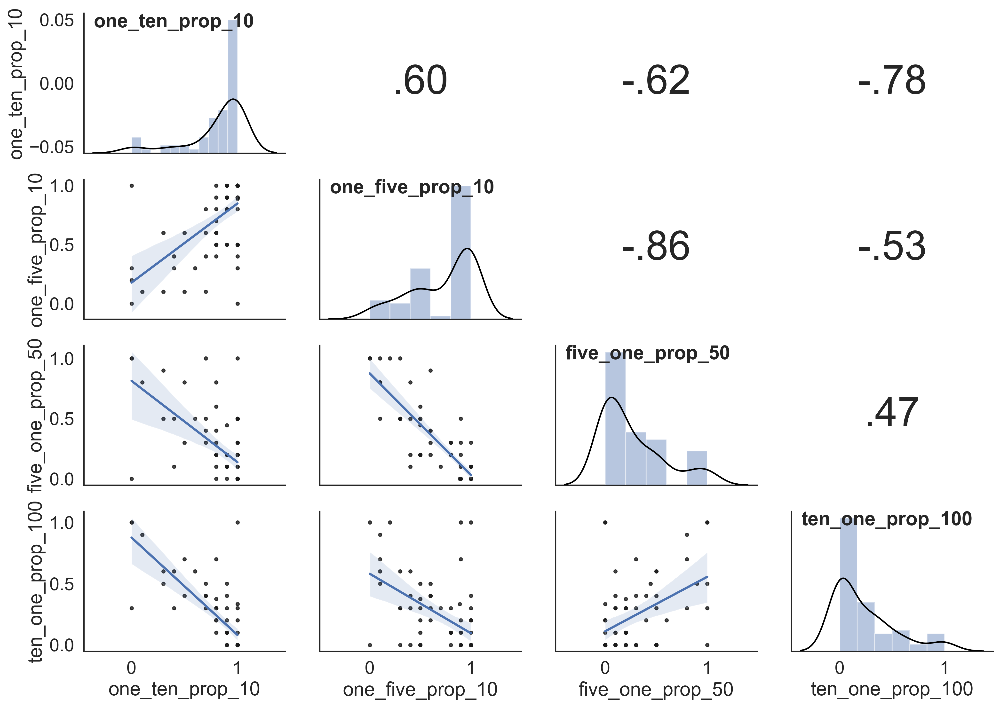

In [9]:
# Correlation matrix
corr_plot(prob_match_df)

#### # Proper probablity matching plot

In [10]:
# PREP FOR EASIER PLOTTING
prob_match_df_long = prob_match_df.copy().dropna().reset_index(drop=True)
prob_match_df_long['p_id'] = list(range(1, len(prob_match_df)+1))

# Turn from wide to long
prob_match_df_long = prob_match_df_long.melt(id_vars=['p_id'])

# Replace header vals with expected value of first option
prob_match_df_long = prob_match_df_long.replace(           
    {
        'one_ten_prop_10':.9, 
        'one_five_prop_10':.8,
        'five_one_prop_50':.2, 
        'ten_one_prop_100':.1
    }
)
prob_match_df_long[::17]

,p_id,variable,value
0,1,0.9,0.8
17,18,0.9,0.8
34,35,0.9,1.0
51,52,0.9,0.1
68,69,0.9,0.8
85,16,0.8,0.6
102,33,0.8,0.9
119,50,0.8,0.3
136,67,0.8,1.0
153,14,0.2,0.3


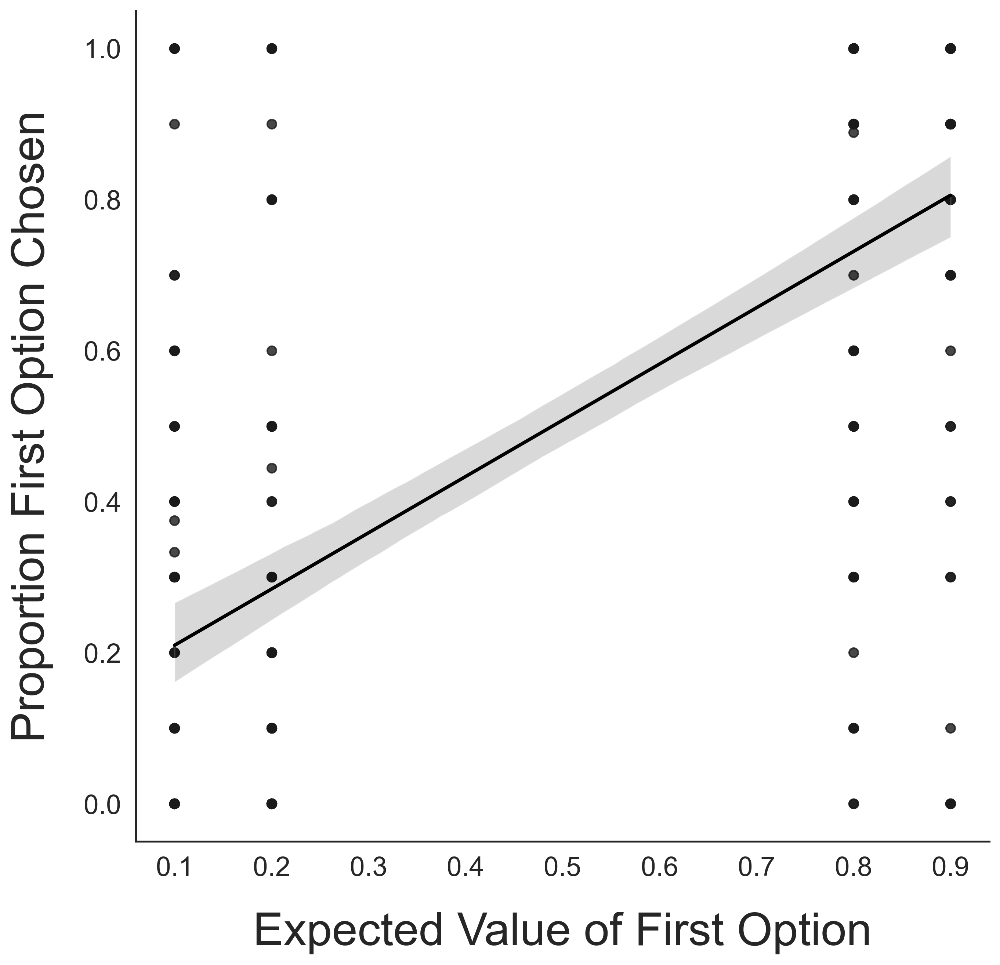

In [11]:
# Scatterplot
fig, ax = plt.subplots(figsize=(10, 10))
sns.regplot(x='variable', y='value', data=prob_match_df_long, 
            scatter_kws={"color": "k"}, line_kws={"color": "black"})
plt.ylabel("Proportion First Option Chosen", fontsize=30, labelpad=20)
plt.xlabel("Expected Value of First Option", fontsize=30, labelpad=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

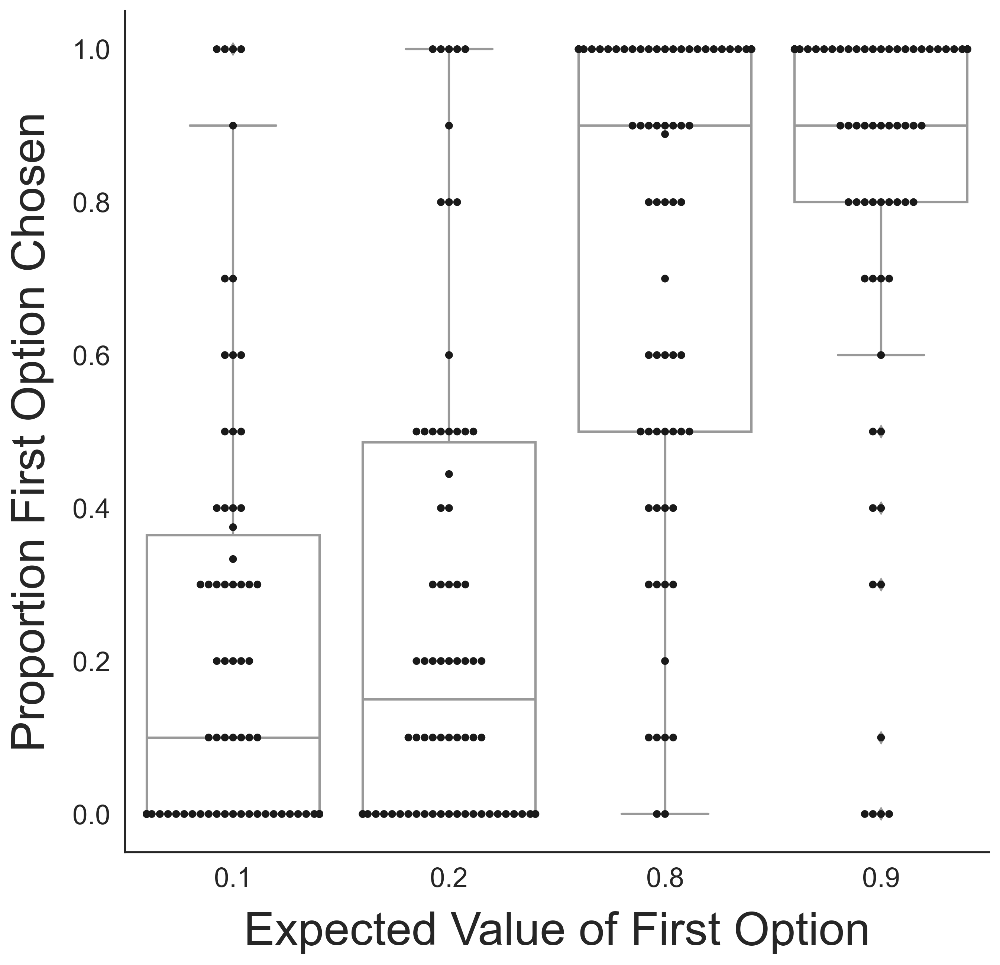

In [12]:
# Boxplot
fig, ax = plt.subplots(figsize=(10, 10))
sns.swarmplot(x='variable', y='value', data=prob_match_df_long, color='k')
sns.boxplot(x='variable', y='value', data=prob_match_df_long, color='w')
plt.ylabel("Proportion First Option Chosen", fontsize=30, labelpad=12)
plt.xlabel("Expected Value of First Option", fontsize=30, labelpad=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

In [13]:
# Repeated measures ANOVA
model = AnovaRM(data=prob_match_df_long, depvar='value', subject='p_id', within=['variable'])
res = model.fit()
res.summary()

,F Value,Num DF,Den DF,Pr > F
variable,55.8675,3.0000,207.0000,0.0000


In [14]:
# Save the results
ttest_prob_match = pd.DataFrame()

# Paired t-tests
for col_1 in list(prob_match_df):
    for col_2 in list(prob_match_df):
        if col_1 == col_2:
            continue
        else:
            res = ttest(prob_match_df[col_1], 
                        prob_match_df[col_2], 
                        paired=True, 
                        alternative='two-sided')
            res['first_col'] = col_1
            res['second_col'] = col_2
            ttest_prob_match = pd.concat([ttest_prob_match, res])
            
ttest_prob_match = ttest_prob_match.reset_index(drop=True)
ttest_prob_match = ttest_prob_match[[ 'first_col', 'second_col', 'T', 'dof',
                                     'alternative', 'p-val', 'CI95%', 'cohen-d',
                                     'BF10', 'power']]
ttest_prob_match['p-val'] = round(ttest_prob_match['p-val'], 6)
ttest_prob_match

,first_col,second_col,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
0,one_ten_prop_10,one_five_prop_10,2.806861,69,two-sided,0.006498,"[0.03, 0.15]",0.299918,4.802,0.696476
1,one_ten_prop_10,five_one_prop_50,8.606652,69,two-sided,0.000000,"[0.42, 0.68]",1.849182,5.363e+09,1.000000
2,one_ten_prop_10,ten_one_prop_100,9.030469,69,two-sided,0.000000,"[0.46, 0.71]",2.035075,2.984e+10,1.000000
3,one_five_prop_10,one_ten_prop_10,-2.806861,69,two-sided,0.006498,"[-0.15, -0.03]",0.299918,4.802,0.696476
4,one_five_prop_10,five_one_prop_50,6.380964,69,two-sided,0.000000,"[0.32, 0.6]",1.470439,7.097e+05,1.000000
5,one_five_prop_10,ten_one_prop_100,7.812891,69,two-sided,0.000000,"[0.37, 0.62]",1.631498,2.15e+08,1.000000
6,five_one_prop_50,one_ten_prop_10,-8.606652,69,two-sided,0.000000,"[-0.68, -0.42]",1.849182,5.363e+09,1.000000
7,five_one_prop_50,one_five_prop_10,-6.380964,69,two-sided,0.000000,"[-0.6, -0.32]",1.470439,7.097e+05,1.000000
8,five_one_prop_50,ten_one_prop_100,0.942884,69,two-sided,0.349030,"[-0.04, 0.11]",0.115641,0.201,0.159025
9,ten_one_prop_100,one_ten_prop_10,-9.030469,69,two-sided,0.000000,"[-0.71, -0.46]",2.035075,2.984e+10,1.000000


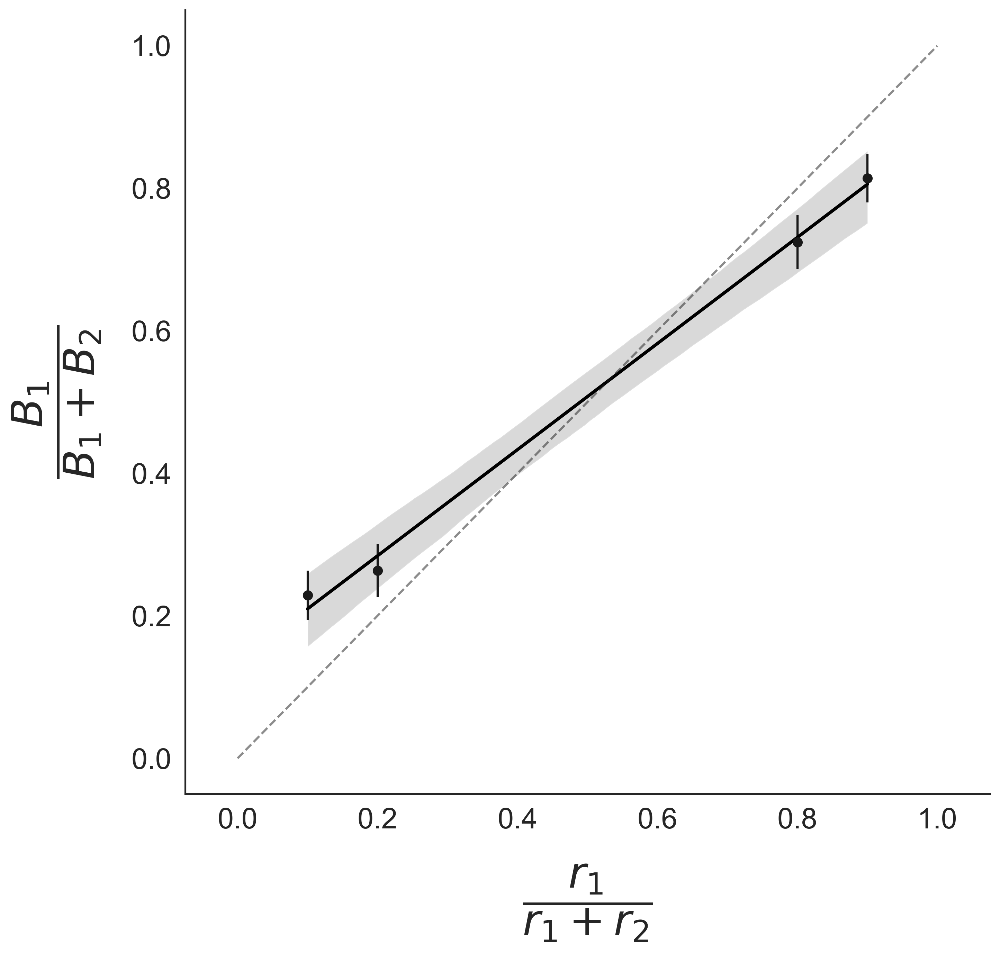

In [15]:
# Scatterplot of just average with errorbars
y_avg = prob_match_df_long.groupby(by=['variable']).mean().reset_index()['value']
err = prob_match_df_long.groupby(by=['variable']).sem().reset_index()['value']

fig, ax = plt.subplots(figsize=(10, 10))
sns.regplot(x='variable', y='value', data=prob_match_df_long, 
            scatter_kws={"color": "w"}, line_kws={"color": "black"})
plt.errorbar(x=[.1, .2, .8, .9], y=y_avg, yerr=err, fmt='o', color='k')
sns.lineplot(x=[0, 1], y=[0, 1], color='k', alpha=0.5, linestyle='dashed')
plt.ylabel(r"$\dfrac{B_{1}}{B_{1}+B_{2}}$", fontsize=30, labelpad=20)
ticks = [0.0, .2, .4, .6, .8, 1.0]
plt.yticks(ticks=ticks, labels=ticks, fontsize=20)
plt.xticks(ticks=ticks, labels=ticks, fontsize=20)
plt.xlim(-0.075, 1.075)
plt.xlabel(r'$\dfrac{r_{1}}{r_{1}+r_{2}}$', fontsize=30, labelpad=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

### Individual Level

In [16]:
x = list(np.log([0.1, 0.2, 0.8, 0.9]).reshape(-1, 1))
scores = []
slopes = []
y_int = []

for i in range(len(prob_match_df)):
    y = list(prob_match_df.iloc[i])
    y = [val+0.1 for val in y]
    y = np.log(y)
    try:
        reg = LinearRegression().fit(x,y)
        scores.append(reg.score(x, y))
        slopes.append(np.abs(reg.coef_[0]))
        y_int.append(reg.intercept_)
    except:
        continue

fit_data = {'gme_r2':scores, 
            'gme_slopes':slopes, 
            'gme_y_int':y_int}

fit_data = pd.DataFrame(fit_data)
fit_data[::7]

,gme_r2,gme_slopes,gme_y_int
0,0.920580,0.449950,-1.122581
7,0.479603,0.244869,-0.186354
14,0.928515,1.242624,0.213707
21,0.897989,1.074830,-2.069812
28,0.928515,1.242624,-2.420982
35,0.364199,0.124757,-0.662325
42,0.996628,0.222348,-0.727247
49,0.467180,0.648170,-1.595744
56,0.544166,0.712587,-1.562668
63,0.930769,0.719142,-1.492078


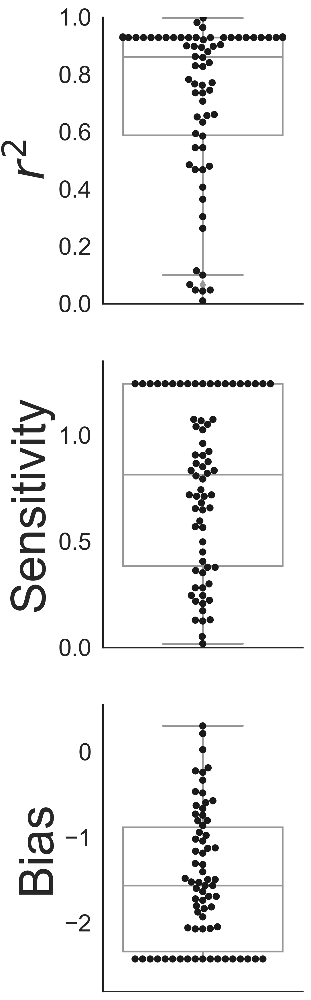

In [17]:
# Boxplot
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(3, 15))
# r2
sns.swarmplot(ax=ax[0], y=fit_data['gme_r2'], color='k', size=6)
sns.boxplot(ax=ax[0], y=fit_data['gme_r2'], color='w')
ax[0].set_ylim(0, 1)
ax[0].set_ylabel("$r^2$", fontsize=40)
ax[0].yaxis.set_tick_params(labelsize=20)
ax[0].spines.right.set_visible(False)
ax[0].spines.top.set_visible(False)

# Slopes
sns.swarmplot(ax=ax[1], y=fit_data['gme_slopes'], color='k', size=6)
sns.boxplot(ax=ax[1], y=fit_data['gme_slopes'], color='w')
ax[1].set_ylim(0, 1.35)
ax[1].set_ylabel("Sensitivity", fontsize=40)
ax[1].yaxis.set_tick_params(labelsize=20)
ax[1].spines.right.set_visible(False)
ax[1].spines.top.set_visible(False)

# Y-int
sns.swarmplot(ax=ax[2], y=fit_data['gme_y_int'], color='k', size=6)
sns.boxplot(ax=ax[2], y=fit_data['gme_y_int'], color='w')
ax[2].set_ylim(-2.8, 0.55)
ax[2].set_ylabel("Bias", fontsize=40)
ax[2].yaxis.set_tick_params(labelsize=20)
ax[2].spines.right.set_visible(False)
ax[2].spines.top.set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

In [18]:
# What is the proportion where VAC is greater than 0.60?
len(fit_data[fit_data['gme_r2']>=.6])/len(fit_data)

0.7285714285714285

In [19]:
# Append to df
df = pd.concat([df, fit_data], axis=1)
df[::9]

,group,race,education,income,one_ten_prop_10,five_one_prop_50,one_five_prop_10,ten_one_prop_100,loss_money_h,gain_money_h,loss_ethics_h,gain_ethics_h,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank,gme_r2,gme_slopes,gme_y_int
0,1,White or Caucasian,High school diploma or GED,"Less than 25,000",0.8,0.2,0.6,0.3,7.05,0.23,0.29,9.65,3.0,1.0,5.0,4.0,6.0,0.920580,0.449950,-1.122581
9,1,White or Caucasian,Associates or technical degree,"50,000-74,999",1.0,0.0,1.0,0.0,0.01,0.23,0.01,9.65,3.0,5.0,1.0,4.0,2.0,0.928515,1.242624,-2.420982
18,1,White or Caucasian,Bachelor's degree,"75,000-99,999",1.0,0.0,1.0,0.0,48.74,99.50,16.61,9.65,4.0,2.0,1.0,5.0,3.0,0.928515,1.242624,-2.420982
27,1,White or Caucasian,Bachelor's degree,"150,000 or more",0.9,0.1,0.9,0.0,0.94,5.48,16.61,9.65,1.0,5.0,3.0,2.0,4.0,0.894130,1.025439,-2.065106
36,1,White or Caucasian,"Graduate or professional degree (MA, MS, MBA, ...","25,000-49,999",0.5,0.8,0.1,0.7,0.40,4.29,16.61,9.65,4.0,2.0,1.0,3.0,5.0,0.303412,0.352131,-0.238887
45,2,White or Caucasian,"Some college, but no degree","$25,000-$49,999",0.0,1.0,0.3,0.3,3.45,1.06,0.02,16.61,4.0,1.0,3.0,5.0,2.0,0.655983,0.743039,-0.222245
54,2,White or Caucasian,"Graduate or professional degree (MA, MS, MBA, ...","$75,000-$99,999",1.0,0.2,0.4,0.0,2.13,1.82,2.13,1.22,1.0,10.0,4.0,2.0,3.0,0.827343,0.851415,-1.928710
63,2,Black or African American,"Some college, but no degree","Less than $25,000",0.9,0.2,0.8,0.1,3.45,3.45,9.65,0.82,5.0,2.0,1.0,3.0,4.0,0.930769,0.719142,-1.492078


## Probability Discounting Tasks

In [20]:
disc_df = df[['group', 'loss_money_h', 'gain_money_h', 'loss_ethics_h', 'gain_ethics_h',]]
disc_df = disc_df[disc_df['group']==2].reset_index(drop=True)
disc_df = disc_df.drop(['group'], axis=1)
disc_df = np.log(disc_df)
disc_df[::8]

,loss_money_h,gain_money_h,loss_ethics_h,gain_ethics_h
0,0.920283,1.953028,0.756122,1.953028
8,0.343590,-1.469676,-2.302585,4.600158
16,0.756122,0.598837,-4.605170,-0.198451
24,-0.462035,1.238374,-0.462035,0.058269


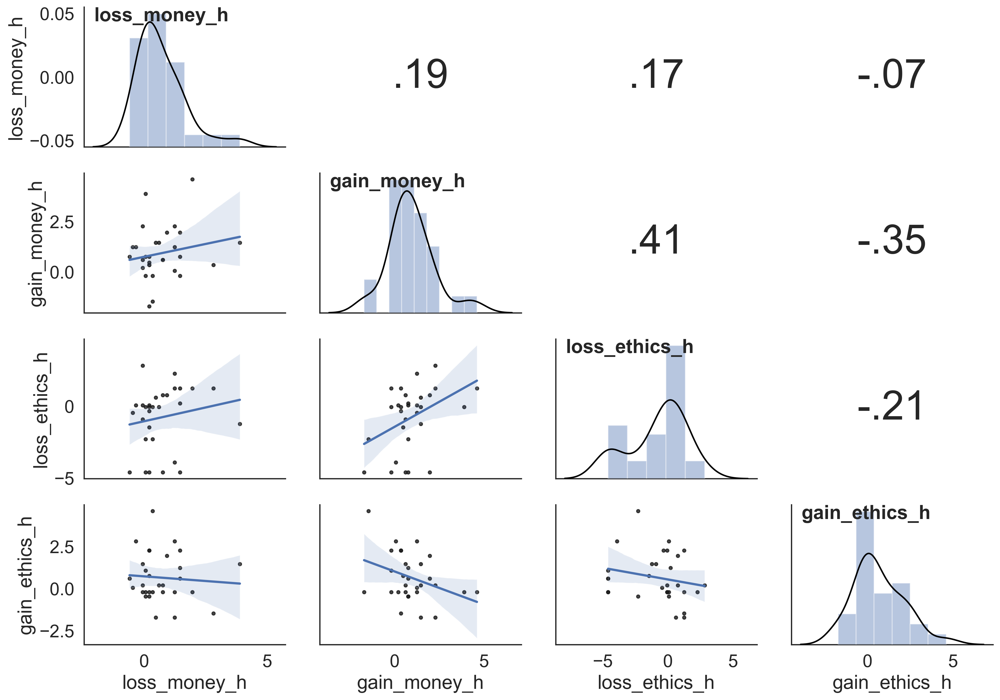

In [21]:
# Correlation matrix
corr_plot(disc_df)

In [22]:
# PREP FOR EASIER PLOTTING
disc_df_long = disc_df.copy()
disc_df_long['p_id'] = list(range(1, len(disc_df_long)+1))

# Turn from wide to long
disc_df_long = disc_df_long.melt(id_vars=['p_id'])

In [23]:
# Repeated measures ANOVA
model = AnovaRM(data=disc_df_long, depvar='value', subject='p_id', within=['variable'])
res = model.fit()
res.summary()

,F Value,Num DF,Den DF,Pr > F
variable,7.9245,3.0000,87.0000,0.0001


In [24]:
# Save the results
ttest_disc_df = pd.DataFrame()

# Paired t-tests
for col_1 in list(disc_df):
    for col_2 in list(disc_df):
        if col_1 == col_2:
            continue
        else:
            res = ttest(disc_df[col_1], 
                        disc_df[col_2], 
                        paired=True, 
                        alternative='two-sided')
            res['first_col'] = col_1
            res['second_col'] = col_2
            ttest_disc_df = pd.concat([ttest_disc_df, res])
            
ttest_disc_df = ttest_disc_df.reset_index(drop=True)
ttest_disc_df = ttest_disc_df[[ 'first_col', 'second_col', 'T', 'dof',
                                     'alternative', 'p-val', 'CI95%', 'cohen-d',
                                     'BF10', 'power']]
ttest_disc_df

,first_col,second_col,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
0,loss_money_h,gain_money_h,-0.912361,29,two-sided,0.369101,"[-0.79, 0.3]",0.212714,0.285,0.203373
1,loss_money_h,loss_ethics_h,3.606569,29,two-sided,0.001151,"[0.64, 2.31]",0.870246,29.275,0.995899
2,loss_money_h,gain_ethics_h,0.091970,29,two-sided,0.927354,"[-0.64, 0.7]",0.024552,0.195,0.051941
3,gain_money_h,loss_money_h,0.912361,29,two-sided,0.369101,"[-0.3, 0.79]",0.212714,0.285,0.203373
4,gain_money_h,loss_ethics_h,4.629200,29,two-sided,0.000071,"[0.96, 2.48]",0.955345,353.708,0.999009
5,gain_money_h,gain_ethics_h,0.665850,29,two-sided,0.510769,"[-0.57, 1.11]",0.199690,0.238,0.184754
6,loss_ethics_h,loss_money_h,-3.606569,29,two-sided,0.001151,"[-2.31, -0.64]",0.870246,29.275,0.995899
7,loss_ethics_h,gain_money_h,-4.629200,29,two-sided,0.000071,"[-2.48, -0.96]",0.955345,353.708,0.999009
8,loss_ethics_h,gain_ethics_h,-2.761855,29,two-sided,0.009869,"[-2.51, -0.37]",0.778646,4.554,0.984607
9,gain_ethics_h,loss_money_h,-0.091970,29,two-sided,0.927354,"[-0.7, 0.64]",0.024552,0.195,0.051941


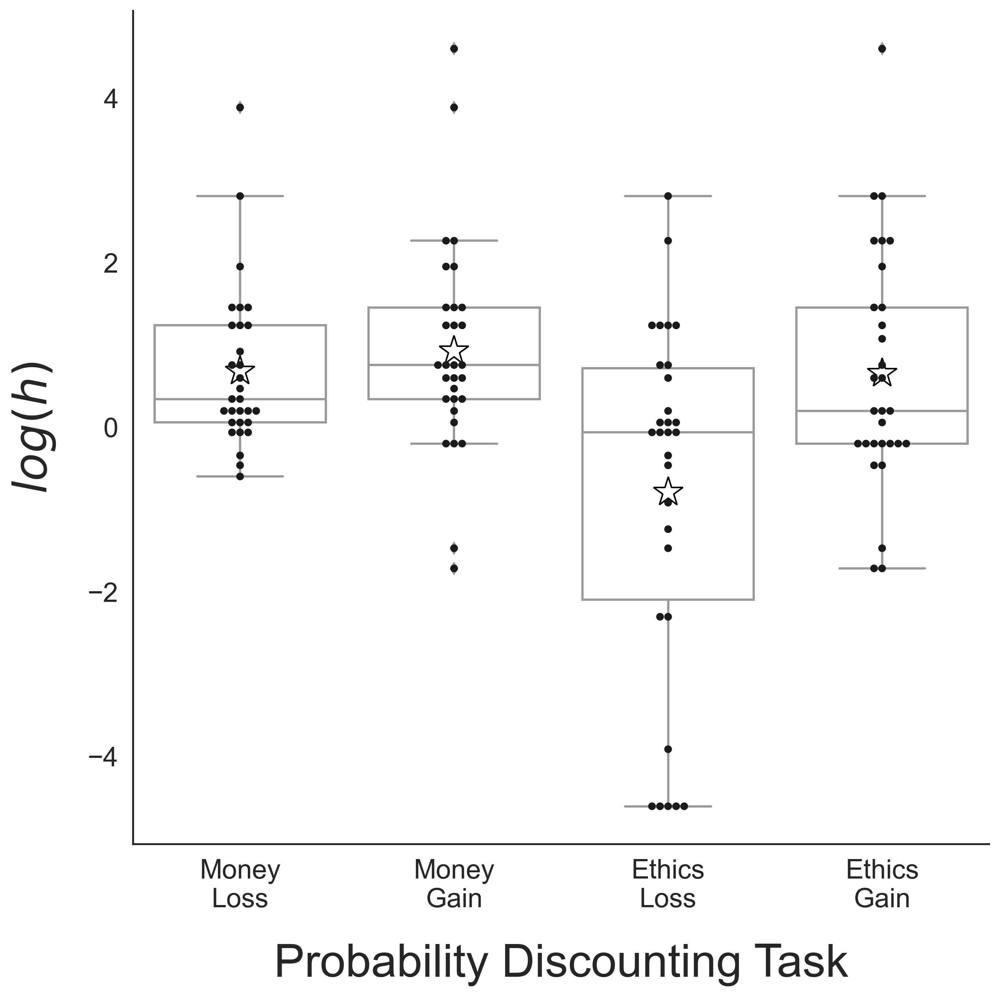

In [25]:
# Boxplot
fig, ax = plt.subplots(figsize=(10, 10))
sns.swarmplot(x='variable', y='value', data=disc_df_long, color='k')
sns.boxplot(x='variable', y='value', data=disc_df_long, color='w', 
            showmeans=True, meanprops={"marker":"*",
                                       "markerfacecolor":"w", 
                                       "markeredgecolor":"black",
                                       "markersize":"20"})
plt.ylabel("$\itlog({h})$", fontsize=30, labelpad=20)
ticks = [0, 1, 2, 3]
labels=['Money\nLoss', 'Money\nGain', 'Ethics\nLoss', 'Ethics\nGain']
plt.xticks(ticks=ticks, labels=labels)
plt.xlabel("Probability Discounting Task", fontsize=30, labelpad=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

#### Ethics Theory Ranking

In [26]:
theor_df = df[['utilitarian_rank', 'deontology_rank', 'virtue_rank', 'ethics_care_rank', 'contract_theory_rank']]
theor_df[::8]

,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank
0,3.0,1.0,5.0,4.0,6.0
8,1.0,2.0,3.0,5.0,4.0
16,3.0,2.0,4.0,5.0,1.0
24,1.0,2.0,4.0,3.0,5.0
32,3.0,4.0,1.0,2.0,5.0
40,1.0,5.0,2.0,4.0,3.0
48,3.0,1.0,2.0,4.0,5.0
56,5.0,4.0,1.0,3.0,2.0
64,2.0,3.0,1.0,4.0,5.0


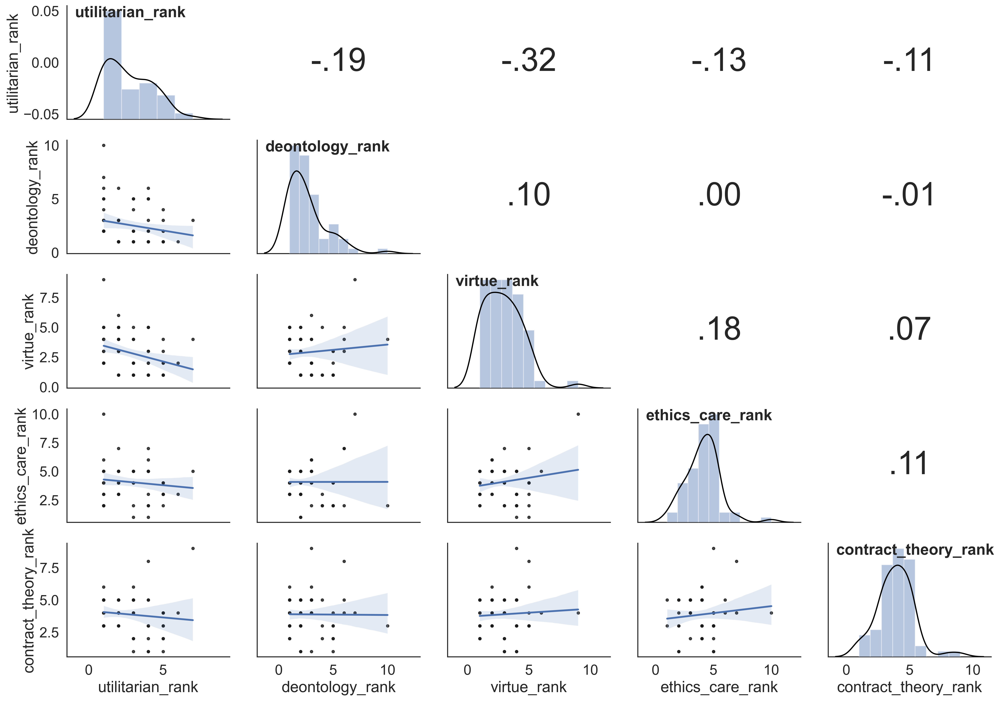

In [27]:
# Correlation matrix
corr_plot(theor_df)

In [28]:
# PREP FOR EASIER PLOTTING
theor_df_long = theor_df.copy()
theor_df_long['p_id'] = list(range(1, len(theor_df)+1))

# Turn from wide to long
theor_df_long = theor_df_long.melt(id_vars=['p_id'])
theor_df_long[::34]

,p_id,variable,value
0,1,utilitarian_rank,3.0
34,35,utilitarian_rank,2.0
68,69,utilitarian_rank,6.0
102,33,deontology_rank,4.0
136,67,deontology_rank,1.0
170,31,virtue_rank,1.0
204,65,virtue_rank,1.0
238,29,ethics_care_rank,5.0
272,63,ethics_care_rank,2.0
306,27,contract_theory_rank,9.0


In [29]:
# Repeated measures ANOVA
theor_df_long = theor_df_long.dropna().reset_index(drop=True)
model = AnovaRM(data=theor_df_long, depvar='value', subject='p_id', within=['variable'])
res = model.fit()
res.summary()

,F Value,Num DF,Den DF,Pr > F
variable,13.2372,4.0000,268.0000,0.0000


In [30]:
# Save the results
ttest_theor_df = pd.DataFrame()

# Paired t-tests
for col_1 in list(theor_df):
    for col_2 in list(theor_df):
        if col_1 == col_2:
            continue
        else:
            res = ttest(theor_df[col_1], 
                        theor_df[col_2], 
                        paired=True, 
                        alternative='two-sided')
            res['first_col'] = col_1
            res['second_col'] = col_2
            ttest_theor_df = pd.concat([ttest_theor_df, res])
            
ttest_theor_df = ttest_theor_df.reset_index(drop=True)
ttest_theor_df = ttest_theor_df[[ 'first_col', 'second_col', 'T', 'dof',
                                     'alternative', 'p-val', 'CI95%', 'cohen-d',
                                     'BF10', 'power']]
ttest_theor_df

,first_col,second_col,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
0,utilitarian_rank,deontology_rank,0.376413,67,two-sided,0.707800,"[-0.51, 0.74]",0.070501,0.143,0.088391
1,utilitarian_rank,virtue_rank,-0.672415,67,two-sided,0.503632,"[-0.82, 0.41]",0.132650,0.165,0.190150
2,utilitarian_rank,ethics_care_rank,-5.044991,67,two-sided,0.000004,"[-1.93, -0.84]",0.919062,4490.597,1.000000
3,utilitarian_rank,contract_theory_rank,-4.422548,67,two-sided,0.000037,"[-1.73, -0.65]",0.799340,528.865,1.000000
4,deontology_rank,utilitarian_rank,-0.376413,67,two-sided,0.707800,"[-0.74, 0.51]",0.070501,0.143,0.088391
5,deontology_rank,virtue_rank,-1.182778,67,two-sided,0.241077,"[-0.87, 0.22]",0.192396,0.259,0.346210
6,deontology_rank,ethics_care_rank,-5.343624,67,two-sided,0.000001,"[-2.06, -0.94]",0.916086,1.313e+04,1.000000
7,deontology_rank,contract_theory_rank,-4.678797,67,two-sided,0.000014,"[-1.87, -0.75]",0.805604,1253.68,1.000000
8,virtue_rank,utilitarian_rank,0.672415,67,two-sided,0.503632,"[-0.41, 0.82]",0.132650,0.165,0.190150
9,virtue_rank,deontology_rank,1.182778,67,two-sided,0.241077,"[-0.22, 0.87]",0.192396,0.259,0.346210


In [31]:
theor_df_long

,p_id,variable,value
0,1,utilitarian_rank,3.0
1,2,utilitarian_rank,4.0
2,3,utilitarian_rank,4.0
3,4,utilitarian_rank,2.0
4,6,utilitarian_rank,3.0
...,...,...,...
335,66,contract_theory_rank,4.0
336,67,contract_theory_rank,3.0
337,68,contract_theory_rank,4.0
338,69,contract_theory_rank,4.0


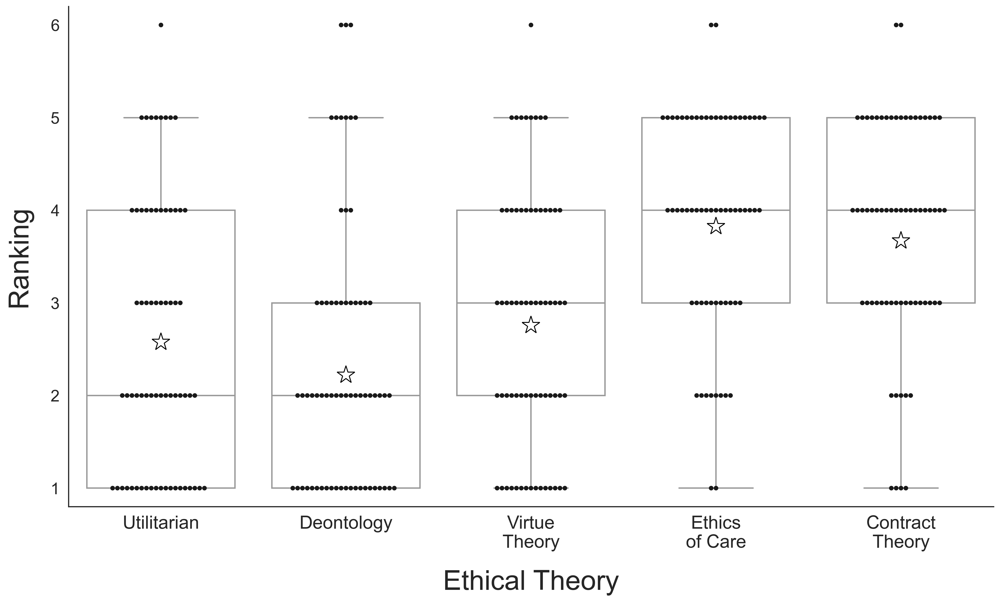

In [32]:
# Boxplot
fig, ax = plt.subplots(figsize=(18, 10))
sns.swarmplot(x='variable', y='value', data=theor_df_long, color='k')
sns.boxplot(x='variable', y='value', data=theor_df_long[theor_df_long['value']<6], color='w', 
           showmeans=True, meanprops={"marker":"*",
                                      "markerfacecolor":"white", 
                                      "markeredgecolor":"black",
                                      "markersize":"20"})
plt.ylabel("Ranking", fontsize=30, labelpad=20)
ticks = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
plt.yticks(ticks=ticks, labels=ticks)
plt.ylim(0.8, 6.2)
ticks = [0, 1, 2, 3, 4]
labels=["Utilitarian", 'Deontology', 'Virtue\nTheory', 'Ethics\nof Care', 'Contract\nTheory']
plt.xticks(ticks=ticks, labels=labels, fontsize=20)
plt.xlabel("Ethical Theory", fontsize=30, labelpad=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

In [33]:
theor_df.describe()

,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank
count,68.000000,68.000000,68.000000,68.000000,68.000000
mean,2.691176,2.573529,2.897059,4.073529,3.882353
std,1.538145,1.789823,1.565864,1.469249,1.440661
min,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,2.000000,3.000000,3.000000
50%,2.000000,2.000000,3.000000,4.000000,4.000000
75%,4.000000,3.000000,4.000000,5.000000,5.000000
max,7.000000,10.000000,9.000000,10.000000,9.000000


# Relationships between different decision-making tasks

In [34]:
# Convert raw rankings to binary category
df['util_rank_cat'] = theory_cat(df=df, col='utilitarian_rank')
df['deont_rank_cat'] = theory_cat(df=df, col='deontology_rank')
df['virtue_rank_cat'] = theory_cat(df=df, col='virtue_rank')
df['care_rank_cat'] = theory_cat(df=df, col='ethics_care_rank')
df['contract_rank_cat'] = theory_cat(df=df, col='contract_theory_rank')

In [35]:
# Arrange for easy plotting
plot_df = df.drop(['race', 'education', 'income', 'utilitarian_rank', 'deontology_rank', 
                   'virtue_rank', 'ethics_care_rank', 'contract_theory_rank', 
                   'one_ten_prop_10', 'one_five_prop_10',
                   'five_one_prop_50', 'ten_one_prop_100'], axis=1)

# Drop those for whom the GME firt was below 0.60
plot_df = plot_df[plot_df['gme_r2']>=0.60].reset_index(drop=True)

plot_df = plot_df.melt(id_vars=['util_rank_cat', 'deont_rank_cat', 
                                'virtue_rank_cat', 'care_rank_cat', 
                                'contract_rank_cat', 'group']).reset_index(drop=True)
plot_df

,util_rank_cat,deont_rank_cat,virtue_rank_cat,care_rank_cat,contract_rank_cat,group,variable,value
0,utilitarian_rank_low,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,1,loss_money_h,7.050000
1,utilitarian_rank_low,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_high,1,loss_money_h,7.050000
2,utilitarian_rank_high,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,1,loss_money_h,16.610000
3,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,1,loss_money_h,1.600000
4,utilitarian_rank_low,deontology_rank_high,virtue_rank_low,ethics_care_rank_high,contract_theory_rank_low,1,loss_money_h,2.510000
...,...,...,...,...,...,...,...,...
352,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,2,gme_y_int,-1.492078
353,utilitarian_rank_high,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,2,gme_y_int,-1.525155
354,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,2,gme_y_int,-2.420982
355,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,2,gme_y_int,-2.420982


In [36]:
plot_df.variable.unique()

array(['loss_money_h', 'gain_money_h', 'loss_ethics_h', 'gain_ethics_h',
       'gme_r2', 'gme_slopes', 'gme_y_int'], dtype=object)

### Differences in matching 

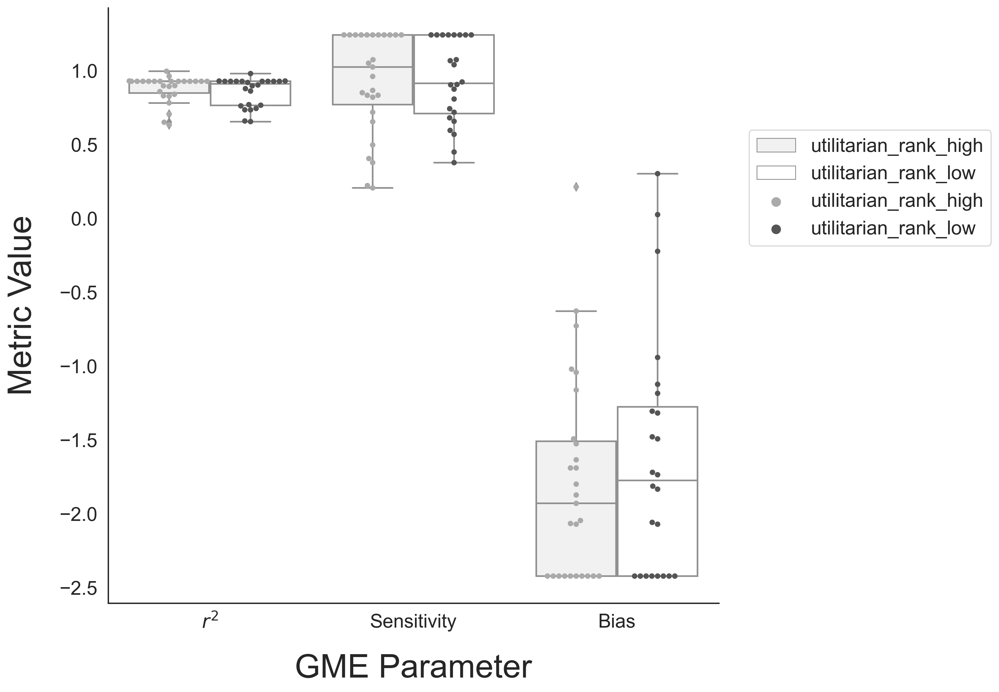

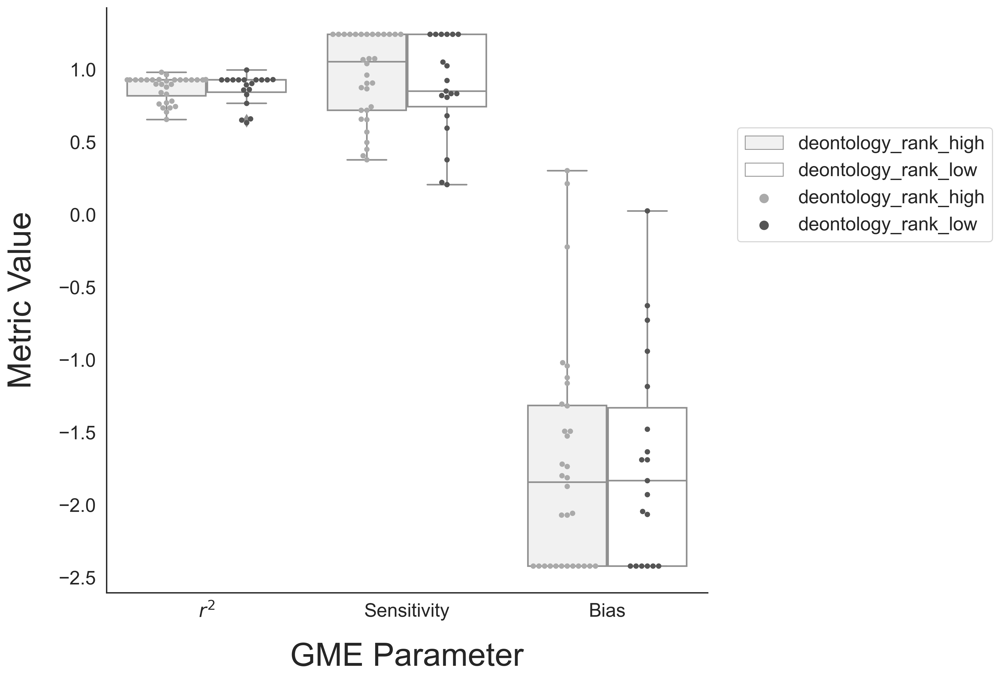

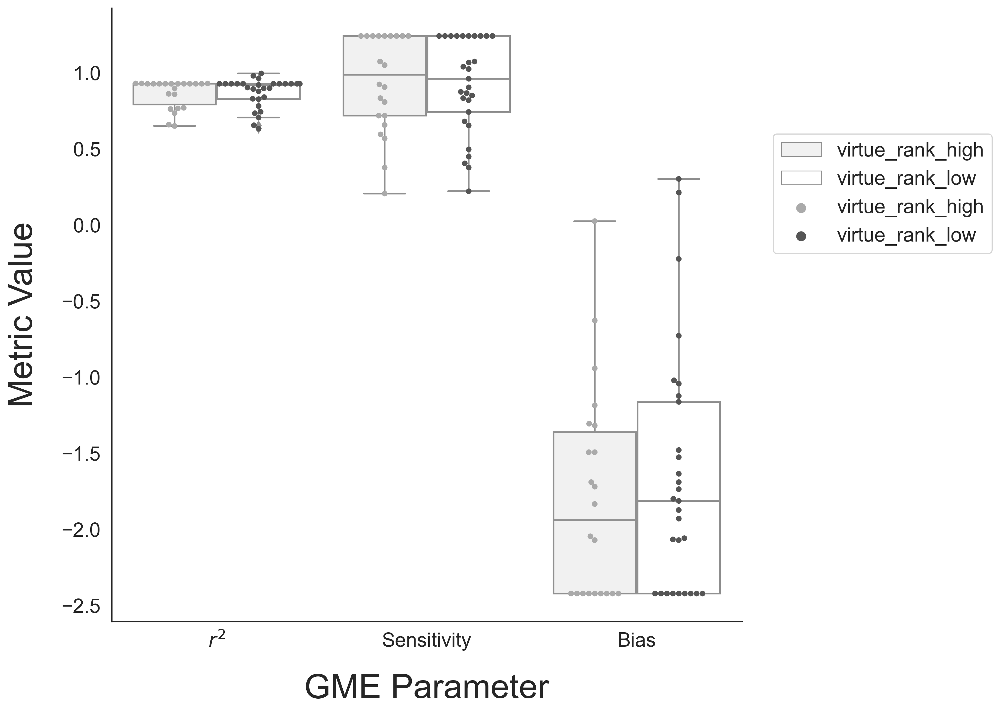

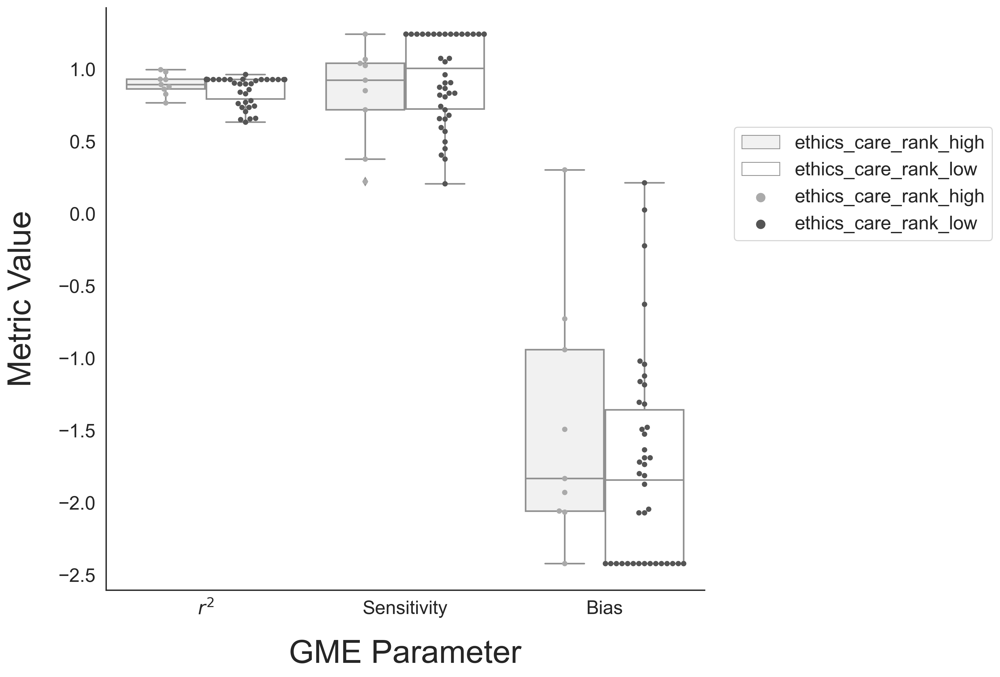

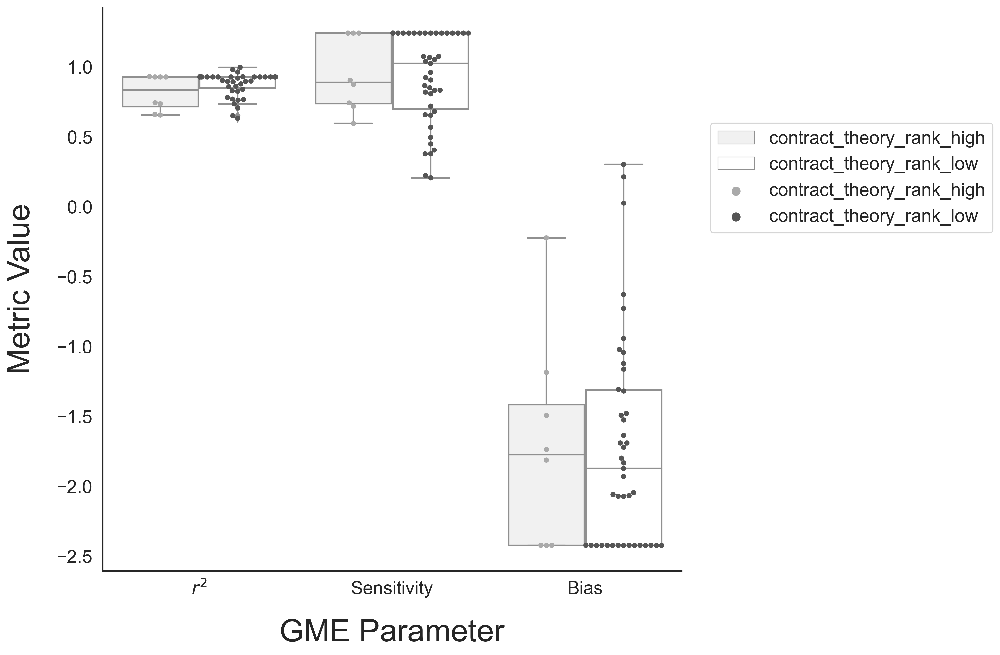

In [37]:
plot_df_prop = plot_df[plot_df['variable'].isin(['gme_r2', 'gme_slopes','gme_y_int'])]

# Boxplots
theories = ['util_rank_cat', 'deont_rank_cat', 'virtue_rank_cat', 'care_rank_cat', 'contract_rank_cat']

for theor in theories:
    plot_df_prop = plot_df_prop.sort_values(by=['variable', theor])
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.swarmplot(x='variable', y='value', hue=theor, dodge=True, data=plot_df_prop, 
                  palette='binary', order=['gme_r2', 'gme_slopes','gme_y_int'])
    sns.boxplot(x='variable', y='value', hue=theor, data=plot_df_prop, color='w')
    plt.ylabel("Metric Value", fontsize=30, labelpad=20)
    ticks = [0, 1, 2]
    labels=['$r^{2}$', 'Sensitivity', 'Bias']
    plt.xticks(ticks=ticks, labels=labels)
    plt.xlabel("GME Parameter", fontsize=30, labelpad=20)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.legend(loc=(1.05,0.6))
    plt.rcParams["figure.dpi"] = 300
    plt.show()

In [38]:
plot_df_prop

,util_rank_cat,deont_rank_cat,virtue_rank_cat,care_rank_cat,contract_rank_cat,group,variable,value
233,utilitarian_rank_high,deontology_rank_high,virtue_rank_high,ethics_care_rank_high,contract_theory_rank_high,1,gme_r2,0.930769
234,utilitarian_rank_low,deontology_rank_low,virtue_rank_low,ethics_care_rank_high,contract_theory_rank_high,1,gme_r2,0.928515
210,utilitarian_rank_low,deontology_rank_low,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_high,1,gme_r2,0.928515
247,utilitarian_rank_low,deontology_rank_low,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_high,2,gme_r2,0.660006
205,utilitarian_rank_low,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_high,1,gme_r2,0.735284
...,...,...,...,...,...,...,...,...
306,utilitarian_rank_low,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,1,gme_y_int,-1.122581
313,utilitarian_rank_high,deontology_rank_low,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,1,gme_y_int,-1.688905
328,utilitarian_rank_high,deontology_rank_low,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,1,gme_y_int,-2.420982
333,utilitarian_rank_high,deontology_rank_low,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,1,gme_y_int,-1.633822


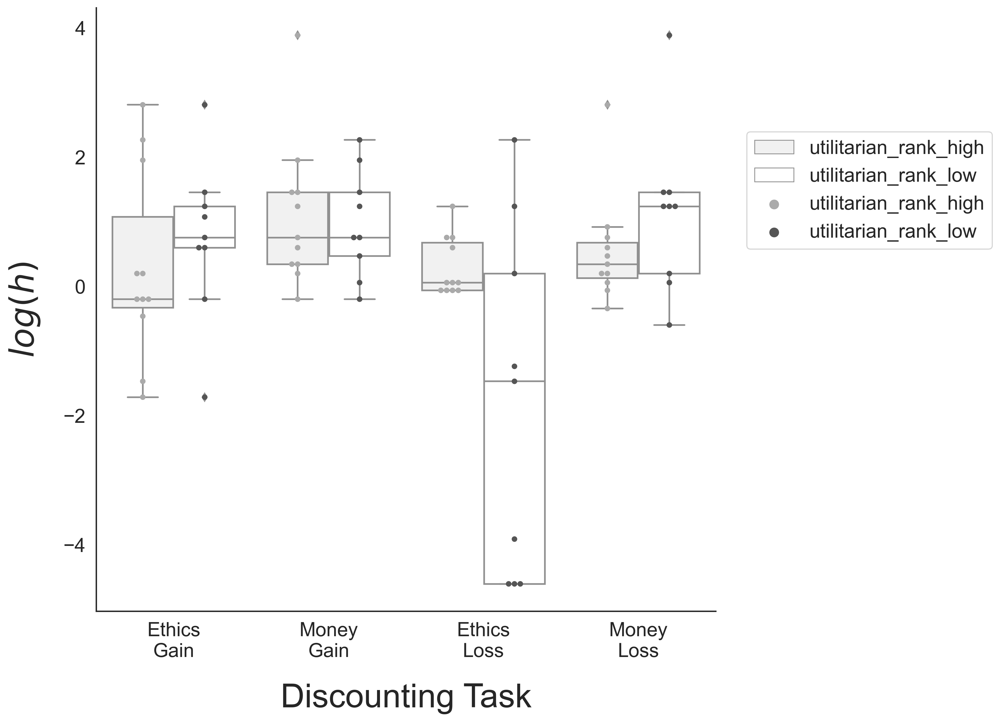

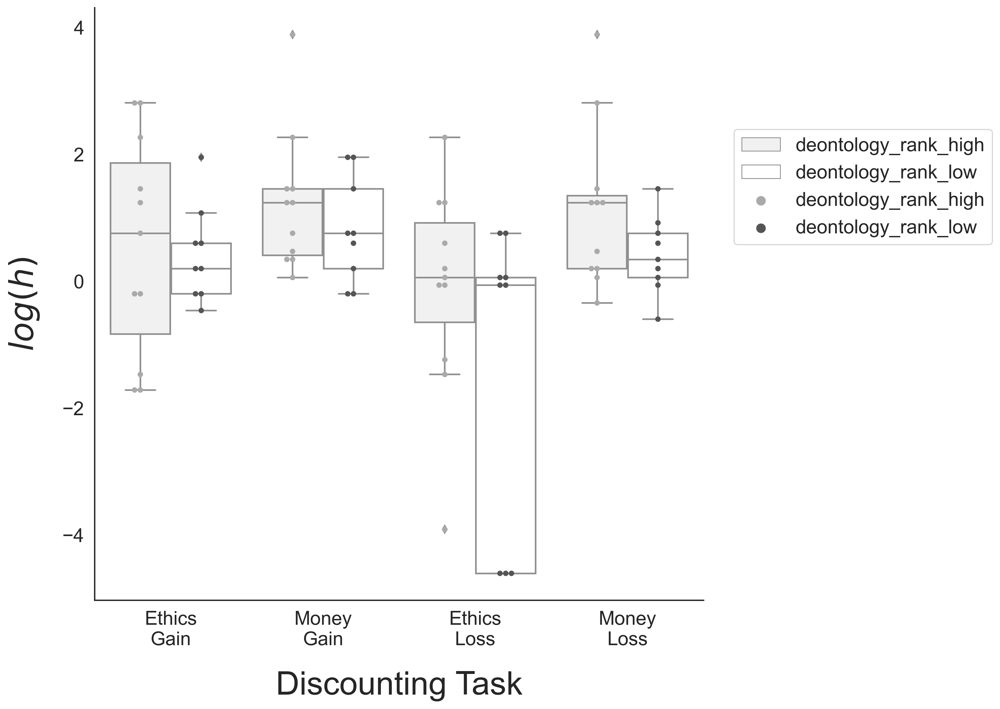

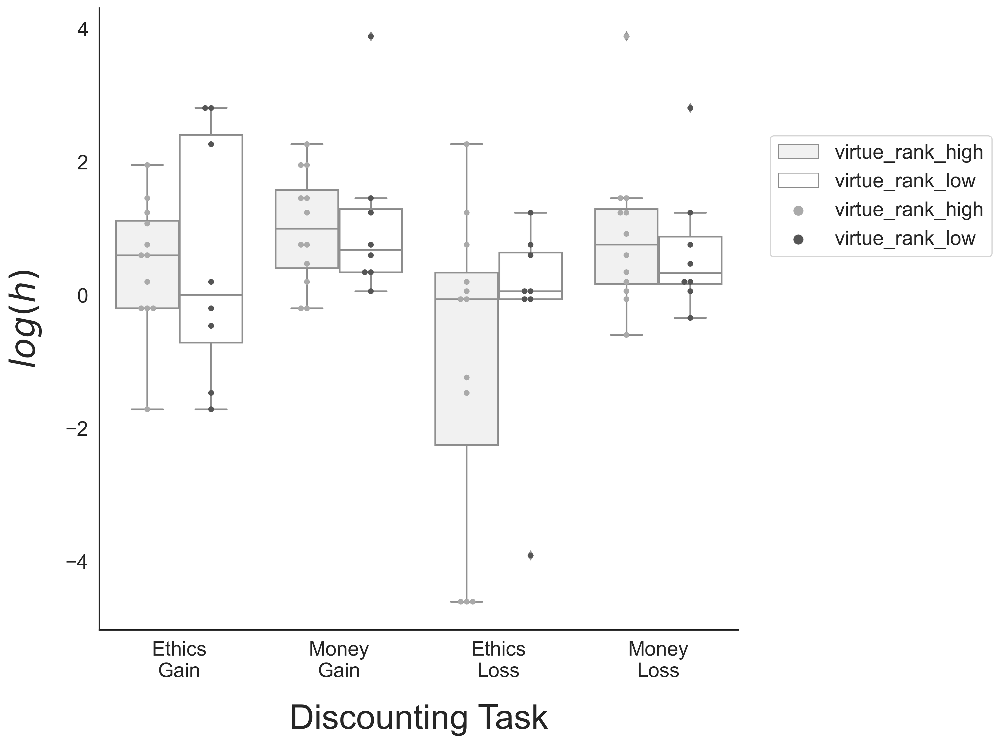

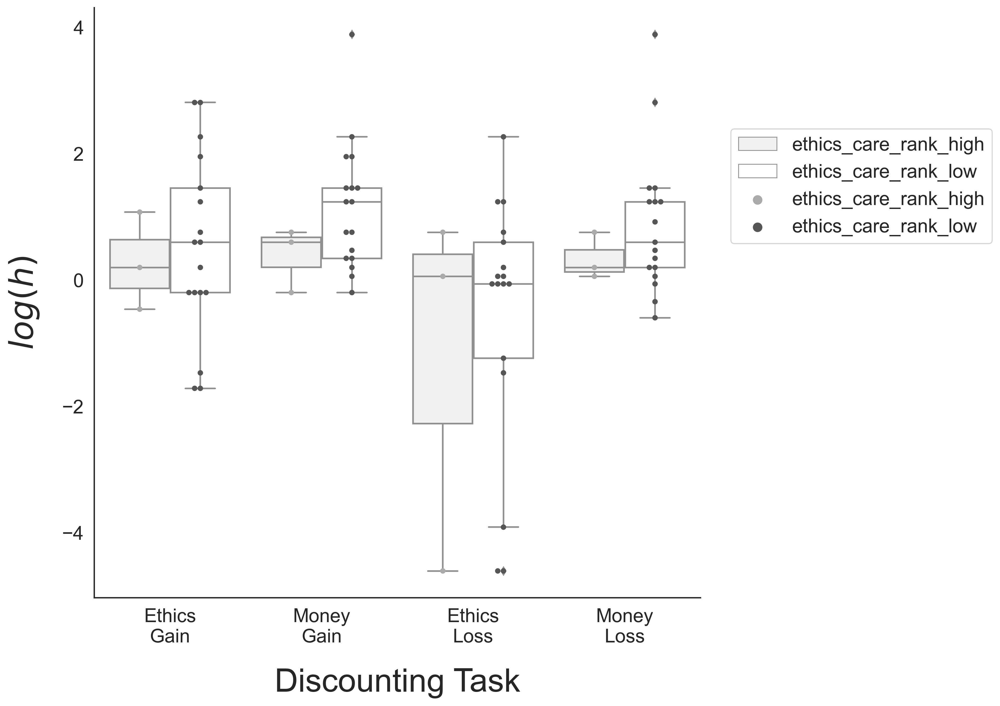

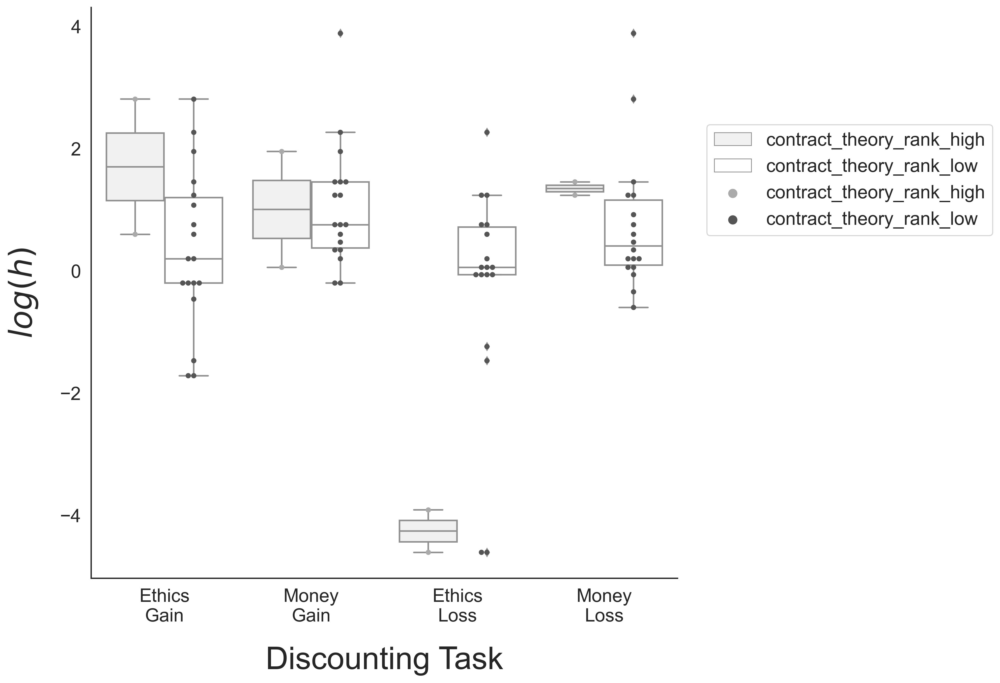

In [39]:
plot_df_prop = plot_df[plot_df['variable'].isin(['loss_money_h', 'gain_money_h', 
                                                 'loss_ethics_h', 'gain_ethics_h'])]

plot_df_prop = plot_df_prop[plot_df_prop['group']==2]

plot_df_prop['value'] = np.log(plot_df_prop['value'])

# Boxplots
theories = ['util_rank_cat', 'deont_rank_cat', 'virtue_rank_cat', 'care_rank_cat', 'contract_rank_cat']

for theor in theories:
    plot_df_prop = plot_df_prop.sort_values(by=['variable', theor])
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.swarmplot(x='variable', y='value', hue=theor, dodge=True, data=plot_df_prop, palette='binary')
    sns.boxplot(x='variable', y='value', hue=theor, data=plot_df_prop, color='w')
    plt.ylabel("$\itlog({h})$", fontsize=30, labelpad=20)
#     plt.ylim(0, 20)
    ticks = [0, 1, 2, 3]
    labels=['Ethics\nGain', 'Money\nGain', 'Ethics\nLoss', 'Money\nLoss']
    plt.xticks(ticks=ticks, labels=labels)
    plt.xlabel("Discounting Task", fontsize=30, labelpad=20)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.legend(loc=(1.05,0.6))
    plt.rcParams["figure.dpi"] = 300
    plt.show()

In [40]:
quant_df = df[['group', 'loss_money_h', 'gain_money_h', 'loss_ethics_h', 'gain_ethics_h']]
quant_df = quant_df[quant_df['group']==2].reset_index(drop=True)
quant_df = quant_df.drop('group', axis=1)
quant_df = np.log(quant_df)
gme_df = df[['gme_r2', 'gme_slopes', 'gme_y_int']]
quant_df = pd.concat([quant_df, gme_df], axis=1)
quant_df[::9]

,loss_money_h,gain_money_h,loss_ethics_h,gain_ethics_h,gme_r2,gme_slopes,gme_y_int
0,0.920283,1.953028,0.756122,1.953028,0.920580,0.449950,-1.122581
9,1.456287,-0.198451,1.238374,2.266958,0.928515,1.242624,-2.420982
18,-0.061875,2.266958,2.810005,0.198851,0.928515,1.242624,-2.420982
27,1.238374,2.266958,1.238374,-1.714798,0.894130,1.025439,-2.065106
36,NaN,NaN,NaN,NaN,0.303412,0.352131,-0.238887
45,NaN,NaN,NaN,NaN,0.655983,0.743039,-0.222245
54,NaN,NaN,NaN,NaN,0.827343,0.851415,-1.928710
63,NaN,NaN,NaN,NaN,0.930769,0.719142,-1.492078


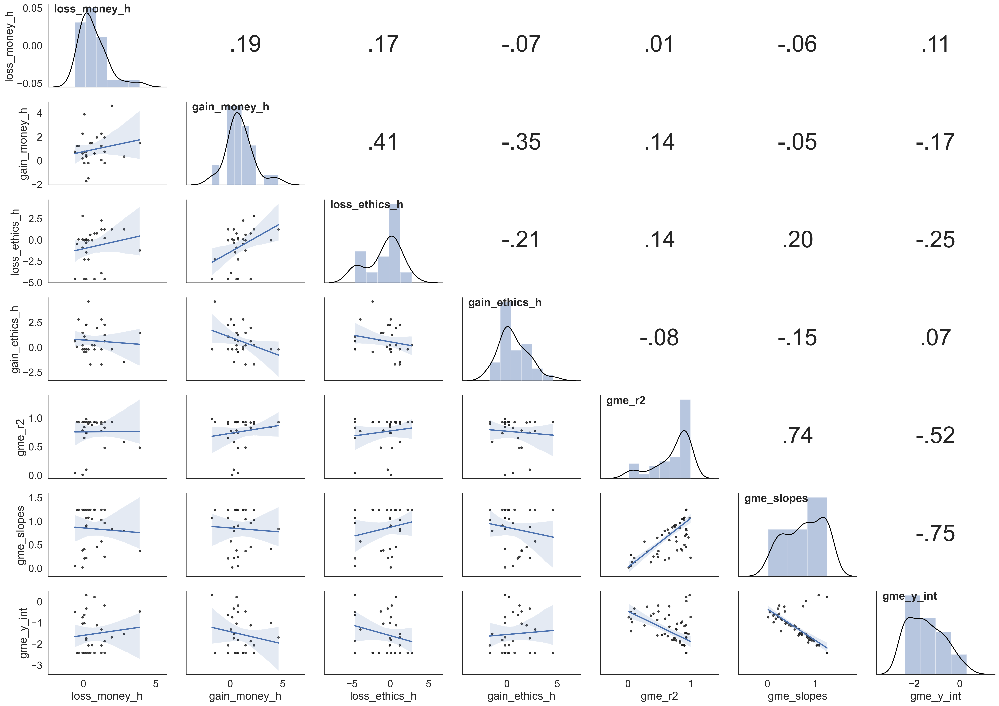

In [41]:
corr_plot(quant_df)

In [42]:
theor_df = df[['group', 'loss_ethics_h', 'gain_ethics_h']]
theor_df = theor_df[theor_df['group']==2].reset_index(drop=True)
theor_df = theor_df.drop('group', axis=1)
theor_df = np.log(theor_df)
rank_df = df[['utilitarian_rank', 'deontology_rank', 'virtue_rank', 
              'ethics_care_rank', 'contract_theory_rank']]
theor_df = pd.concat([theor_df, rank_df], axis=1)
theor_df = theor_df.dropna().reset_index(drop=True)
theor_df[::9]

,loss_ethics_h,gain_ethics_h,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank
0,0.756122,1.953028,3.0,1.0,5.0,4.0,6.0
9,1.238374,-1.469676,2.0,1.0,3.0,5.0,4.0
18,-0.061875,0.198851,3.0,2.0,4.0,1.0,5.0
27,-2.302585,-0.462035,2.0,3.0,6.0,5.0,4.0


In [43]:
theor_df.describe()

,loss_ethics_h,gain_ethics_h,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank
count,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000
mean,-0.805559,0.597558,2.551724,2.137931,3.241379,4.172414,3.896552
std,2.224930,1.436469,1.525643,1.274030,1.327058,1.311187,1.543300
min,-4.605170,-1.714798,1.000000,1.000000,1.000000,1.000000,1.000000
25%,-2.302585,-0.198451,1.000000,1.000000,3.000000,4.000000,3.000000
50%,-0.061875,0.198851,2.000000,2.000000,3.000000,5.000000,4.000000
75%,0.756122,1.456287,3.000000,2.000000,4.000000,5.000000,5.000000
max,2.810005,4.600158,7.000000,6.000000,6.000000,7.000000,9.000000


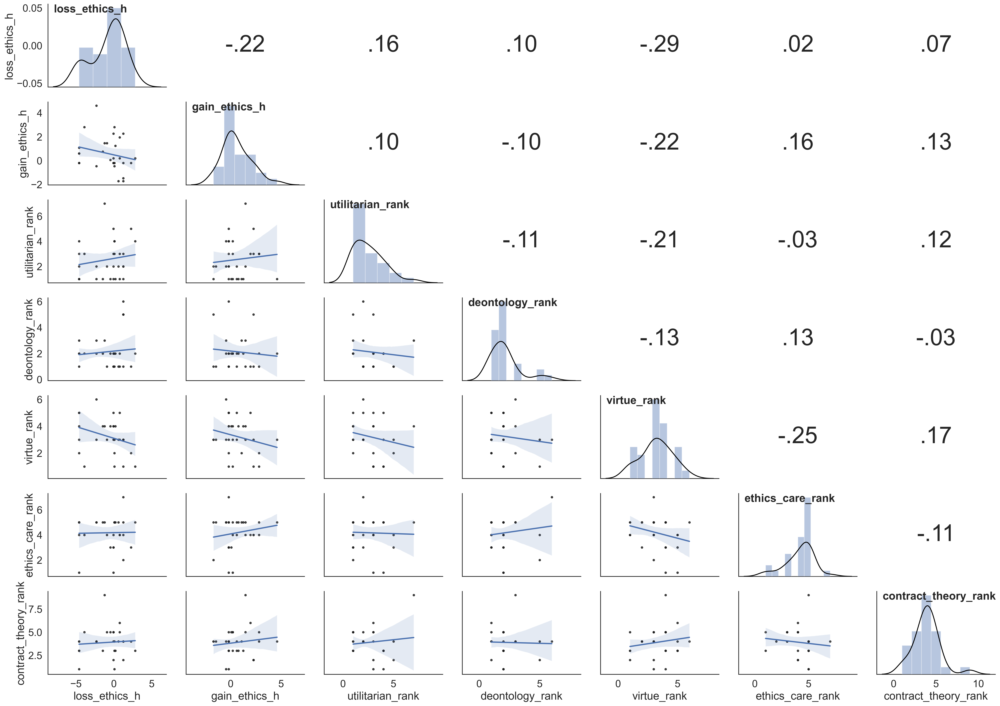

In [44]:
corr_plot(theor_df)